In [1]:
# Display the Folders/Classes

import numpy as np
import pandas as pd 
import os
from shutil import copyfile

# copy .py file into the working directory (make sure it has .py suffix)
# copyfile(src = "../input/model-evaluation-utils/model_evaluation_utils.py", dst = "../working/model_evaluation_utils.py")

print(os.listdir('Images/'))
dog_classes = os.listdir('Images/')

['n02085620-Chihuahua', 'n02085782-Japanese_spaniel', 'n02085936-Maltese_dog', 'n02086079-Pekinese', 'n02086240-Shih-Tzu', 'n02086646-Blenheim_spaniel', 'n02086910-papillon', 'n02087046-toy_terrier', 'n02087394-Rhodesian_ridgeback', 'n02088094-Afghan_hound', 'n02088238-basset', 'n02088364-beagle', 'n02088466-bloodhound', 'n02088632-bluetick', 'n02089078-black-and-tan_coonhound', 'n02089867-Walker_hound', 'n02089973-English_foxhound', 'n02090379-redbone', 'n02090622-borzoi', 'n02090721-Irish_wolfhound', 'n02091032-Italian_greyhound', 'n02091134-whippet', 'n02091244-Ibizan_hound', 'n02091467-Norwegian_elkhound', 'n02091635-otterhound', 'n02091831-Saluki', 'n02092002-Scottish_deerhound', 'n02092339-Weimaraner', 'n02093256-Staffordshire_bullterrier', 'n02093428-American_Staffordshire_terrier', 'n02093647-Bedlington_terrier', 'n02093754-Border_terrier', 'n02093859-Kerry_blue_terrier', 'n02093991-Irish_terrier', 'n02094114-Norfolk_terrier', 'n02094258-Norwich_terrier', 'n02094433-Yorkshire_t

In [13]:
pip install matplotlib

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'C:\python\A1_keras\Scripts\python.exe -m pip install --upgrade pip' command.


In [2]:
# Get the dog labels

breeds = [breed.split('-',1)[1] for breed in dog_classes] # get labels by splitting the folder name at dash
breeds[:10] # view some of the labels

['Chihuahua',
 'Japanese_spaniel',
 'Maltese_dog',
 'Pekinese',
 'Shih-Tzu',
 'Blenheim_spaniel',
 'papillon',
 'toy_terrier',
 'Rhodesian_ridgeback',
 'Afghan_hound']

In [3]:
# Get images full path and their labels

from itertools import chain

X = []
y = []

fullpaths = ['Images/{}'.format(dog_class) for dog_class in dog_classes]

for counter, fullpath in enumerate(fullpaths):
    for imgname in os.listdir(fullpath):
        X.append([fullpath + '/' + imgname])
        y.append(breeds[counter])

X = list(chain.from_iterable(X)) # unnest the lists and join together into one list

len(X) # number of pictures

20580

In [4]:
# Random shuffle the images for learning

import random

# shuffle X and y
combined = list(zip(X, y))
random.shuffle(combined)

X[:], y[:] = zip(*combined)

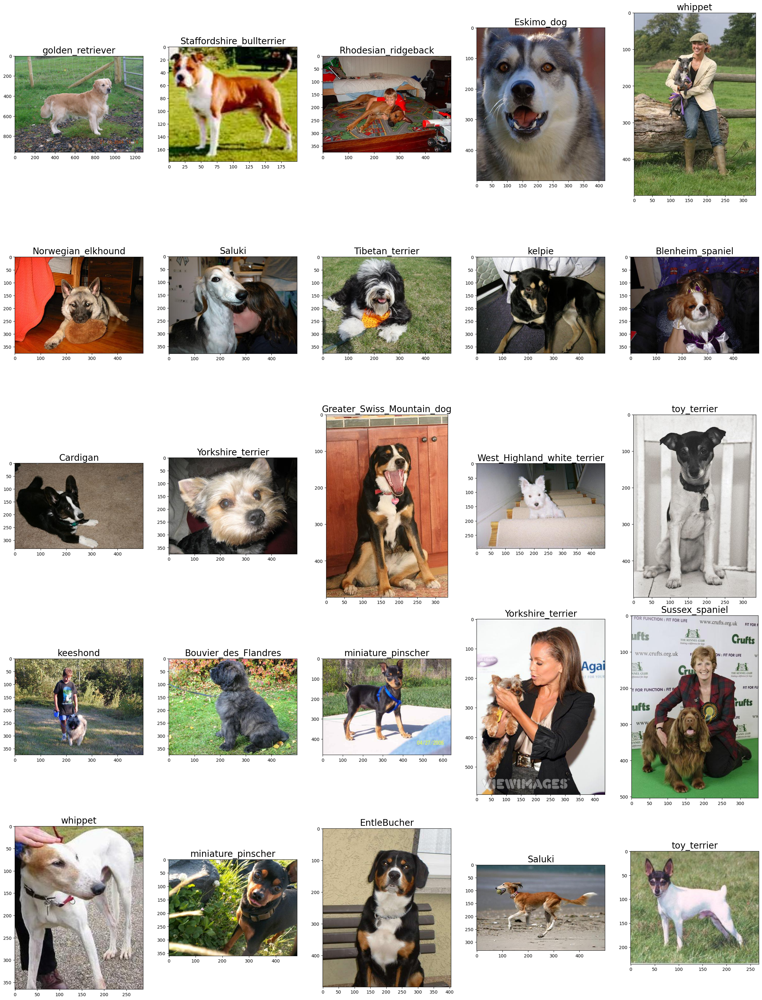

In [5]:
# Display random dogs pictures 

import matplotlib.pyplot as plt
%matplotlib inline 
from matplotlib.image import imread

plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(X)), 25)): # random 25 images
    plt.subplot(5, 5, counter+1)
    plt.subplots_adjust(hspace=0.1)
    filename = X[i]
    image = imread(filename)
    plt.imshow(image)
    plt.title(y[i], fontsize=20)

    
plt.show()

In [7]:
# Choose a subset to test code

X = X[:4000]
y = y[:4000]

In [8]:
# Convert labels to one-hot encoded labels

from sklearn.preprocessing import LabelEncoder
from keras.utils import to_categorical

# Label and one-hot encoding y labels
le = LabelEncoder()
le.fit(y)
y_ohe = to_categorical(le.transform(y), len(breeds))
y_ohe = np.array(y_ohe)

In [9]:
# Prepare train, validation and test data
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import img_to_array, load_img

img_data = np.array([img_to_array(load_img(img, target_size = (299,299)))
                     for img in X]) # load, resize images, and store as array

x_train, x_test, y_train, y_test = train_test_split(img_data, y_ohe,
                                                   test_size = 0.2,
                                                   stratify=np.array(y), # stratify makes sure that proportion of each class in the output is same as the input
                                                   random_state = 2) 

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train,
                                                 test_size = 0.2,
                                                 stratify=np.array(y_train),
                                                 random_state = 2)

print('Training Dataset Size: ', x_train.shape)
print('Validation Dataset Size: ', x_val.shape)
print('Testing Dataset Size: ', x_test.shape)
print('Training Label Size: ', y_train.shape)
print('Validation Label Size: ', y_val.shape)
print('Testing Label Size: ', y_test.shape)

# clear some space from memory
import gc
del img_data
gc.collect()

Training Dataset Size:  (2560, 299, 299, 3)
Validation Dataset Size:  (640, 299, 299, 3)
Testing Dataset Size:  (800, 299, 299, 3)
Training Label Size:  (2560, 120)
Validation Label Size:  (640, 120)
Testing Label Size:  (800, 120)


0

In [10]:
import tensorflow as tf
if tf.config.experimental.list_physical_devices('GPU'):
    tf.config.experimental.set_memory_growth(tf.config.experimental.list_physical_devices('GPU')[0], True)


In [11]:
# Data Augmentation

from keras.applications.xception import preprocess_input
from keras.preprocessing.image import ImageDataGenerator

batch_size = 32

# Create train generator
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input, # only use rescale=1./255 if training from scratch
                                  rotation_range = 30,
                                  width_shift_range = 0.2,
                                  height_shift_range = 0.2,
                                  horizontal_flip = True) # CHECK

train_generator = train_datagen.flow(x_train, y_train,
                                     shuffle = False, batch_size = batch_size, seed = 1)

# Create validation generator
val_datagen = ImageDataGenerator(preprocessing_function=preprocess_input) # do not augment validation data

val_generator = val_datagen.flow(x_val, y_val,
                                shuffle = False, batch_size = batch_size, seed = 1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


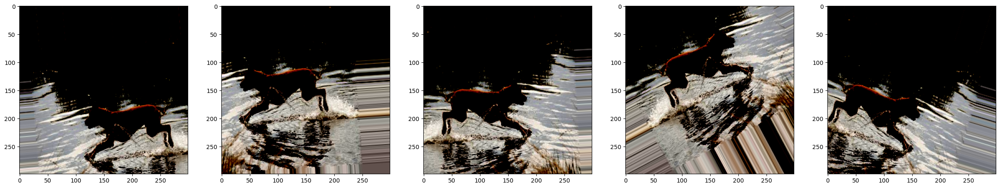

In [12]:
img_id = 16

dog_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                     shuffle = False, batch_size = batch_size, seed = 1)

plt.figure(figsize=(30,20))
dogs = [next(dog_generator) for i in range(0,5)]
for counter, dog in enumerate(dogs): 
    plt.subplot(1, 5, counter+1)
    plt.imshow(dog[0][0])
    #plt.axis('off')
    
plt.show()

In [14]:
# Build Model Using Pre-trained Model

from keras import models
from keras import layers
from keras.optimizers import RMSprop
from keras.layers import GlobalAveragePooling2D, Dense, Flatten, Dropout
from keras.applications.xception import Xception
from keras.utils import to_categorical
from keras.utils import plot_model



# load InceptionV3 pre-trained model
base_model = Xception(weights = 'imagenet', include_top = False, input_shape = (299,299,3))

h = base_model.layers[-1].output_shape[1]
w = base_model.layers[-1].output_shape[2]
d = base_model.layers[-1].output_shape[3]

model = models.Sequential()
model.add(base_model) # add pre_trained layers
model.add(GlobalAveragePooling2D())
# model.add(Flatten()) # flatten to 1-D vector to prepare for fully connected layers
model.add(Dropout(0.2))
model.add(Dense(512, activation = 'relu', input_dim=h*w*d))
# model.add(Dense(512, activation = 'relu'))
# model.add(Dropout(0.2))
model.add(Dense(len(breeds), activation = 'softmax'))


# Freeze pre-trained layers
print('Number of trainable weights before freezing the base layer:', len(model.trainable_weights))
model.layers[0].trainable = False
print('Number of trainable weights after freezing the base layer:', len(model.trainable_weights))

Number of trainable weights before freezing the base layer: 158
Number of trainable weights after freezing the base layer: 4


In [15]:
# Compile the Model

model.compile(RMSprop(learning_rate=.0001), loss='categorical_crossentropy', metrics=['accuracy']) 
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 xception (Functional)       (None, 10, 10, 2048)      20861480  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_1 (Dropout)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dense_3 (Dense)             (None, 120)               61560     
                                                                 
Total params: 21,972,128
Trainable params: 1,110,648
Non-trainable params: 20,861,480
__________________________________

In [15]:
plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [16]:
import tensorflow as tf

gpus = tf.config.experimental.list_physical_devices('GPU')
for gpu in gpus: 
    tf.config.experimental.set_memory_growth(gpu, True)
    
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [17]:
from tensorflow.keras.callbacks import EarlyStopping

# Train Model
early_stop = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
train_steps_per_epoch = x_train.shape[0] // batch_size
val_steps_per_epoch = x_val.shape[0] // batch_size
epochs = 20

history = model.fit_generator(train_generator,
                             steps_per_epoch = train_steps_per_epoch,
                             validation_data = val_generator,
                             validation_steps = val_steps_per_epoch,
                             epochs = epochs, callbacks=[early_stop], verbose = 1)




C:\conda_tmp\ipykernel_24904\800907147.py:9: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator,


Epoch 1/20
80/80 [==============================] - 786s 10s/step - loss: 4.4189 - accuracy: 0.1773 - val_loss: 3.8723 - val_accuracy: 0.5406
Epoch 2/20
80/80 [==============================] - 847s 11s/step - loss: 3.4479 - accuracy: 0.5645 - val_loss: 2.7886 - val_accuracy: 0.7328
Epoch 3/20
80/80 [==============================] - 833s 10s/step - loss: 2.4465 - accuracy: 0.7254 - val_loss: 1.8713 - val_accuracy: 0.7937
Epoch 4/20
80/80 [==============================] - 843s 11s/step - loss: 1.6520 - accuracy: 0.8008 - val_loss: 1.2521 - val_accuracy: 0.8313
Epoch 5/20
80/80 [==============================] - 772s 10s/step - loss: 1.1522 - accuracy: 0.8449 - val_loss: 0.8863 - val_accuracy: 0.8516
Epoch 6/20
80/80 [==============================] - 454s 6s/step - loss: 0.8489 - accuracy: 0.8645 - val_loss: 0.6888 - val_accuracy: 0.8578
Epoch 7/20
80/80 [==============================] - 424s 5s/step - loss: 0.6807 - accuracy: 0.8770 - val_loss: 0.5845 - val_accuracy: 0.8625
Epoch 8/

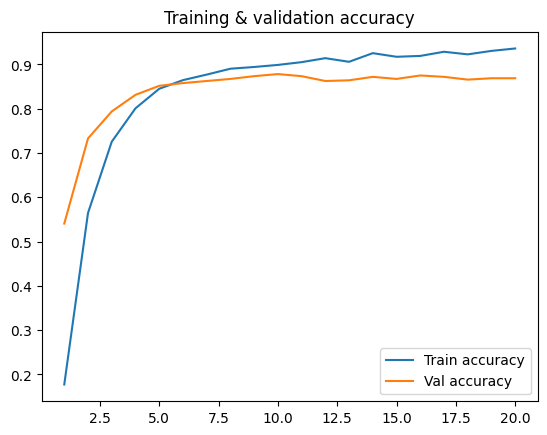

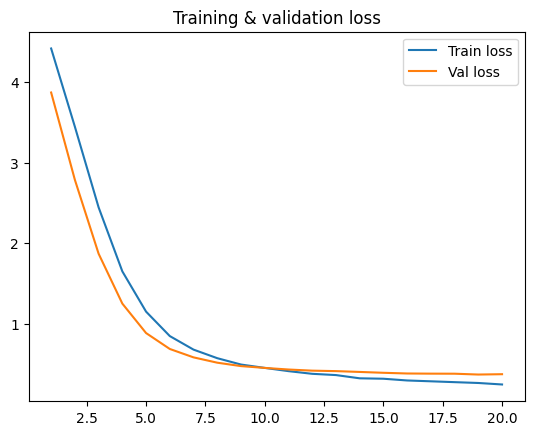

In [18]:
# Plot result
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)

# Accuracy
plt.plot(epochs, acc, label='Train accuracy')
plt.plot(epochs, val_acc, label='Val accuracy')
plt.title('Training & validation accuracy')
plt.legend()

# Loss
plt.figure()
plt.plot(epochs, loss, label='Train loss')
plt.plot(epochs, val_loss, label='Val loss')
plt.title('Training & validation loss')
plt.legend()
plt.show()

In [19]:
# Evaluate Model on Test Data

x_test1 = x_test / 255. # rescale to 0-1. Divide by 255 as its the max RGB value
# test_predictions = model.predict(x_test1)
with tf.device('/CPU:0'):
    test_predictions = model.predict(x_test1)

# get model predictions
predictions = le.classes_[np.argmax(test_predictions,axis=1)] # get labels and reverse back to get the text labels
# get target labels
target_labels = le.classes_[np.argmax(y_test,axis=1)]

# Store in dataframe
predict_df = pd.DataFrame({'Target_Labels': target_labels, 'Predictions': predictions})
predict_df.head(20)

25/25 [==============================] - 478s 19s/step


,Target_Labels,Predictions
0,komondor,komondor
1,Siberian_husky,malamute
2,chow,chow
3,kelpie,kelpie
4,Bouvier_des_Flandres,Bouvier_des_Flandres
5,Brabancon_griffon,Brabancon_griffon
6,Norfolk_terrier,Norfolk_terrier
7,English_foxhound,English_foxhound
8,schipperke,schipperke
9,Pembroke,Pembroke


In [20]:
# Get accuracy of measure

correct = (target_labels == predictions)
accuracy = correct.sum() / correct.size
print(accuracy)

0.89


In [21]:
# Evaluate Model Performance

from model_evaluation_utils import get_metrics

get_metrics(true_labels=target_labels,
            predicted_labels=predictions)

Accuracy: 0.89
Precision: 0.8986
Recall: 0.89
F1 Score: 0.8875


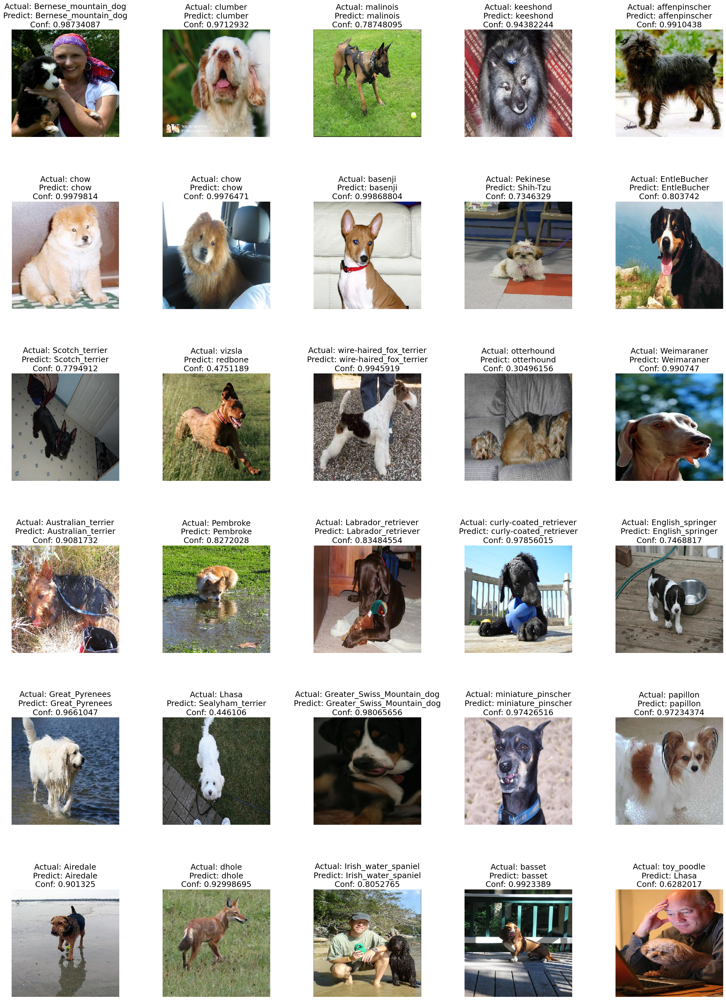

In [22]:
# Plot Actual vs Predicted Images with Confidence Levels
    
plt.figure(figsize=(30,40))
for counter, i in enumerate(random.sample(range(0, len(y_test)), 30)): # random 30 images
    plt.subplot(6, 5, counter+1)
    plt.subplots_adjust(hspace=0.6)
    actual = str(target_labels[i])
    predicted = str(predictions[i])
    conf = str(max(test_predictions[i]))
    plt.imshow(x_test[i]/255.0)
    plt.axis('off')
    plt.title('Actual: ' + actual + '\nPredict: ' + predicted + '\nConf: ' + conf, fontsize=18)
    
plt.show()

In [24]:
import pickle

# Specify the file path where you want to save the model
file_path = 'model3.pkl'

# Save the model to the pickle file
with open(file_path, 'wb') as file:
    pickle.dump(model, file)


INFO:tensorflow:Assets written to: ram://8bd5fa08-54fd-4bcb-8c7f-bb2cf3ef39a4/assets


INFO:tensorflow:Assets written to: ram://8bd5fa08-54fd-4bcb-8c7f-bb2cf3ef39a4/assets


In [25]:
model.save('model3.keras')

In [17]:
import sys
print(sys.version)

import tensorflow as tf
print(tf.__version__)



3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]
2.10.0


In [26]:
model.save('model3.h5')

In [38]:
import tensorflow as tf

# Reset GPU memory growth
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
    except RuntimeError as e:
        print(e)


In [36]:
import tensorflow as tf
tf.config.experimental.list_physical_devices('GPU')


[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]